In [75]:
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns; sns.set(style="ticks", color_codes=True)
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.svm import LinearSVC, SVC
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline

In [76]:
#all pitchers 1980-2022
ss_p_df = pd.read_csv('ss_p_df_clean.csv')
ss_p_df

,Rk,Player,WAR,GS,Season,Age,Team,Lg,W,L,...,Peak_FG_FIP-,Peak_FG_K%,Peak_FG_BB%,Peak_FG_E-F,Peak_Next_WAR,Peak_Prev_WAR,Exceed_Prev_WAR,Exceed_Peak_WAR,Team_GP,Team_WL
0,11156,Kevin Appier,-0.8,5,1989,21,13,0,1,4,...,75,0.222,0.096,0.35,4.6,9.3,0.0,1.0,162,0.568
1,1400,Tom Gordon,3.3,16,1989,21,13,0,17,9,...,96,0.187,0.129,-0.16,1.4,3.6,0.0,0.0,162,0.568
2,2419,Luis Aquino,2.3,16,1989,25,13,0,6,8,...,129,0.076,0.109,-2.81,3.1,2.3,0.0,1.0,162,0.568
3,5333,Floyd Bannister,0.7,14,1989,34,13,0,4,1,...,94,0.163,0.075,0.72,4.7,4.2,0.0,1.0,162,0.568
4,209,Mark Gubicza,6.3,36,1989,26,13,0,15,11,...,74,0.163,0.059,0.32,1.2,7.7,0.0,0.0,162,0.568
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6551,2417,Mike Witt,2.3,26,1982,21,4,0,8,6,...,92,0.180,0.079,-0.17,1.5,6.1,0.0,0.0,162,0.574
6552,12323,Rick Sutcliffe,-2.5,10,1980,24,14,1,3,9,...,93,0.157,0.108,-1.01,3.1,-0.2,1.0,0.0,163,0.564
6553,2122,Bob Welch,2.6,32,1980,23,14,1,14,9,...,87,0.188,0.087,-0.51,1.6,3.2,1.0,0.0,163,0.564
6554,2954,Frank Tanana,1.9,31,1980,26,4,0,11,12,...,88,0.129,0.052,0.56,1.1,NaN,NaN,0.0,160,0.406


In [77]:
#find 2023 data
ss_p_df_2023 = ss_p_df[(ss_p_df['Peak_Season'] == 2022) & (ss_p_df['Season'] == 2022)]
#test set
ss_p_df_2023

,Rk,Player,WAR,GS,Season,Age,Team,Lg,W,L,...,Peak_FG_FIP-,Peak_FG_K%,Peak_FG_BB%,Peak_FG_E-F,Peak_Next_WAR,Peak_Prev_WAR,Exceed_Prev_WAR,Exceed_Peak_WAR,Team_GP,Team_WL
3968,6967,Brad Keller,0.2,22,2022,26,13,0,6,14,...,120,0.156,0.089,0.27,NaN,-0.3,1.0,NaN,162,0.401
4128,8480,Jack Flaherty,-0.1,8,2022,26,25,1,2,1,...,130,0.195,0.134,-0.71,NaN,0.7,0.0,NaN,162,0.574
4130,8438,Packy Naughton,-0.1,3,2022,26,25,1,0,2,...,131,0.182,0.000,5.17,NaN,-0.2,1.0,NaN,162,0.574
4208,12131,Josh Fleming,-1.5,3,2022,26,26,0,2,5,...,149,0.190,0.069,3.66,NaN,-0.6,0.0,NaN,162,0.531
4224,2487,Michael Kopech,2.2,25,2022,26,6,0,5,9,...,110,0.213,0.115,-0.95,NaN,1.4,1.0,NaN,162,0.500
4225,190,Dylan Cease,6.4,32,2022,26,6,0,14,8,...,75,0.304,0.104,-0.90,NaN,2.9,1.0,NaN,162,0.500
4351,4890,David Peterson,0.9,19,2022,26,17,1,7,5,...,88,0.278,0.104,0.44,NaN,-0.5,1.0,NaN,162,0.623
4352,7898,Tylor Megill,0.0,9,2022,26,17,1,4,2,...,93,0.270,0.063,1.41,NaN,0.6,0.0,NaN,162,0.623
4777,1180,Kyle Wright,3.6,30,2022,26,1,1,21,5,...,91,0.236,0.072,-0.39,NaN,-0.3,1.0,NaN,162,0.623
4808,11711,Connor Seabold,-1.0,5,2022,26,3,0,0,4,...,163,0.194,0.082,4.91,NaN,0.0,0.0,NaN,162,0.481


In [78]:
#drop nans from batting_ss_peaks_merge2
ss_p_df_train = ss_p_df[ss_p_df['Exceed_Peak_WAR'].notna()]
ss_p_df_train = ss_p_df_train[ss_p_df_train['Exceed_Peak_WAR'] != '']
ss_p_df_train = ss_p_df_train[ss_p_df_train['Exceed_Prev_WAR'] != '']

#train set
ss_p_df_train

,Rk,Player,WAR,GS,Season,Age,Team,Lg,W,L,...,Peak_FG_FIP-,Peak_FG_K%,Peak_FG_BB%,Peak_FG_E-F,Peak_Next_WAR,Peak_Prev_WAR,Exceed_Prev_WAR,Exceed_Peak_WAR,Team_GP,Team_WL
0,11156,Kevin Appier,-0.8,5,1989,21,13,0,1,4,...,75,0.222,0.096,0.35,4.6,9.3,0.0,1.0,162,0.568
1,1400,Tom Gordon,3.3,16,1989,21,13,0,17,9,...,96,0.187,0.129,-0.16,1.4,3.6,0.0,0.0,162,0.568
2,2419,Luis Aquino,2.3,16,1989,25,13,0,6,8,...,129,0.076,0.109,-2.81,3.1,2.3,0.0,1.0,162,0.568
3,5333,Floyd Bannister,0.7,14,1989,34,13,0,4,1,...,94,0.163,0.075,0.72,4.7,4.2,0.0,1.0,162,0.568
4,209,Mark Gubicza,6.3,36,1989,26,13,0,15,11,...,74,0.163,0.059,0.32,1.2,7.7,0.0,0.0,162,0.568
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6551,2417,Mike Witt,2.3,26,1982,21,4,0,8,6,...,92,0.180,0.079,-0.17,1.5,6.1,0.0,0.0,162,0.574
6552,12323,Rick Sutcliffe,-2.5,10,1980,24,14,1,3,9,...,93,0.157,0.108,-1.01,3.1,-0.2,1.0,0.0,163,0.564
6553,2122,Bob Welch,2.6,32,1980,23,14,1,14,9,...,87,0.188,0.087,-0.51,1.6,3.2,1.0,0.0,163,0.564
6554,2954,Frank Tanana,1.9,31,1980,26,4,0,11,12,...,88,0.129,0.052,0.56,1.1,NaN,NaN,0.0,160,0.406


In [79]:
#drop rows where Prev_WAR are null
ss_p_df_train_2 = ss_p_df_train.dropna(subset=['Prev_WAR'])

In [80]:
#grab player name
ss_p_df_train_2_player = ss_p_df_2023['Player'].reset_index(drop=True)

In [81]:
#drop Next_WAR & Peak_Next_WAR cols 
ss_p_df_train_2 = ss_p_df_train_2.drop(['Next_WAR','Peak_Next_WAR','Player'], axis=1)

In [82]:
#drop rows where Prev_WAR are null
ss_p_df_2023_2 = ss_p_df_2023.dropna(subset=['Prev_WAR'])

In [83]:
#grab player name
ss_p_df_2023_2_player = ss_p_df_2023_2['Player'].reset_index(drop=True)

In [84]:
#drop Next_WAR & Peak_Next_WAR cols 
ss_p_df_2023_2 = ss_p_df_2023_2.drop(['Next_WAR','Peak_Next_WAR','Player'], axis=1)

In [85]:
#Drop initial cols
ss_p_df_train_2 = ss_p_df_train_2.drop(['Rk','Peak_Rk','FG_-WPA','Peak_FG_-WPA'], axis=1)

In [86]:
#check correlation

In [87]:
#split dataframe for correlation
ss_p_df_train_2_1 = ss_p_df_train_2.iloc[:, 0:50]
ss_p_df_train_2_2 = ss_p_df_train_2.iloc[:, 51:100]
ss_p_df_train_2_3 = ss_p_df_train_2.iloc[:, 101:]

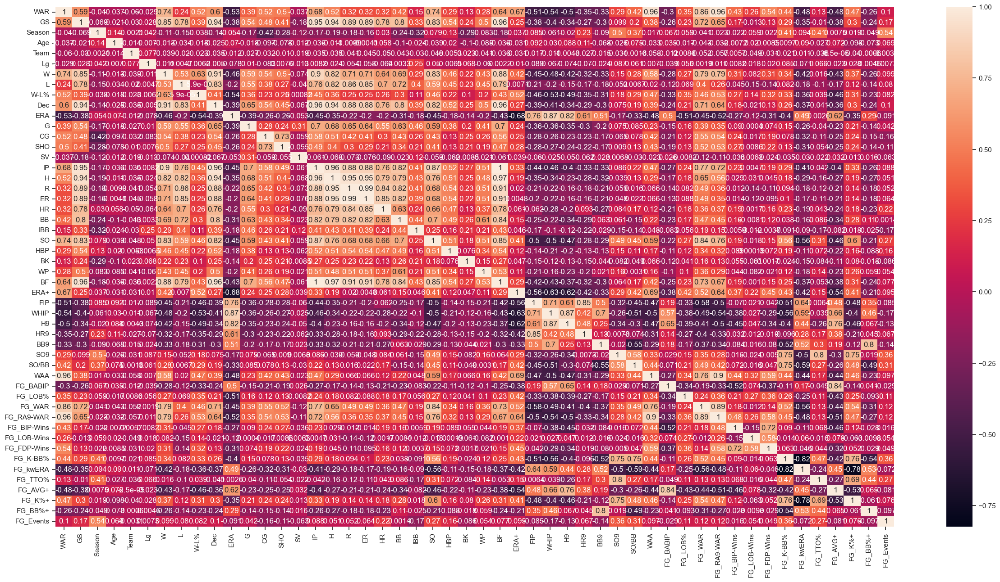

In [88]:
#correlation
X = ss_p_df_train_2_1.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_1.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_1.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

In [89]:
#WAA & WAR
#FG_WAR & WAR
#FG_RA9-WAR & WAR
#W & GS
#L & GS
#Dec & GS
#IP & GS
#H & GS
#R & GS
#ER & GS
#HR & GS
#BB & GS
#SO & GS
#BF & GS
#DEC & W
#W & SO
#W & BF
#W & IP
#W & H
#FG_WAR & W
#FG_RA9-WAR & W
#BF & L
#H, R, ER, DEC & L
#DEC & W, L

In [90]:
ss_p_df_train_2 = ss_p_df_train_2.drop(['WAA','Peak_WAA','FG_WAR',
                                    'Peak_FG_WAR', 'FG_RA9-WAR', 
                                    'W', 'L', 'GS', 'Dec', 'IP', 
                                    'H', 'R', 'ER', 'HR', 'BB', 
                                    'SO', 'BF'], axis=1)

In [91]:
ss_p_df_train_2 = ss_p_df_train_2.drop(['Peak_FG_RA9-WAR', 
                                    'Peak_W', 'Peak_L', 'Peak_GS', 'Peak_Dec', 'Peak_IP', 
                                    'Peak_H', 'Peak_R', 'Peak_ER', 'Peak_HR', 'Peak_BB', 
                                    'Peak_SO', 'Peak_BF'], axis=1)

In [92]:
#set x and y
ss_p_df_X = ss_p_df_train_2.loc[:, ss_p_df_train_2.columns != 'Exceed_Peak_WAR'].values
ss_p_df_y = ss_p_df_train_2.loc[:, ss_p_df_train_2.columns == 'Exceed_Peak_WAR'].values.ravel()

In [93]:
#split dataframe for correlation check
ss_p_df_train_2_1 = ss_p_df_train_2.iloc[:, 0:25]
ss_p_df_train_2_2 = ss_p_df_train_2.iloc[:, 26:50]
ss_p_df_train_2_3 = ss_p_df_train_2.iloc[:, 51:75]
ss_p_df_train_2_4 = ss_p_df_train_2.iloc[:, 76:]

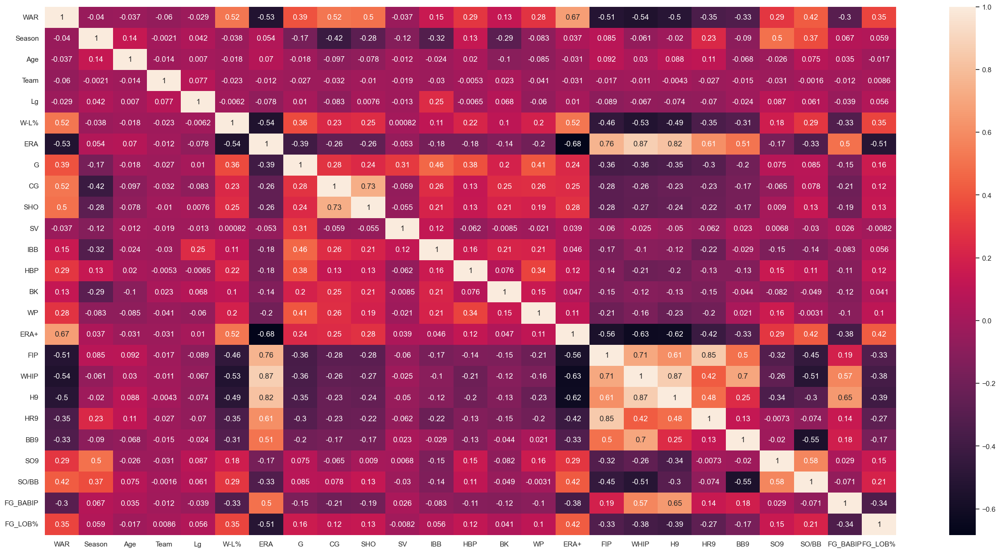

In [94]:
#correlation
X = ss_p_df_train_2_1.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_1.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_1.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

In [95]:
#WHIP & ERA
#FG_WHIP & FG_ERA
#HR9 & FIP
#FG_HR9 & FG_FIP
#BB9 & WHIP
#FG_BB9 & FG_WHIP
#H9 & WHIP
#FG_H9 & FG_WHIP
#H9 & ERA
#FG_H9 & FG_ERA

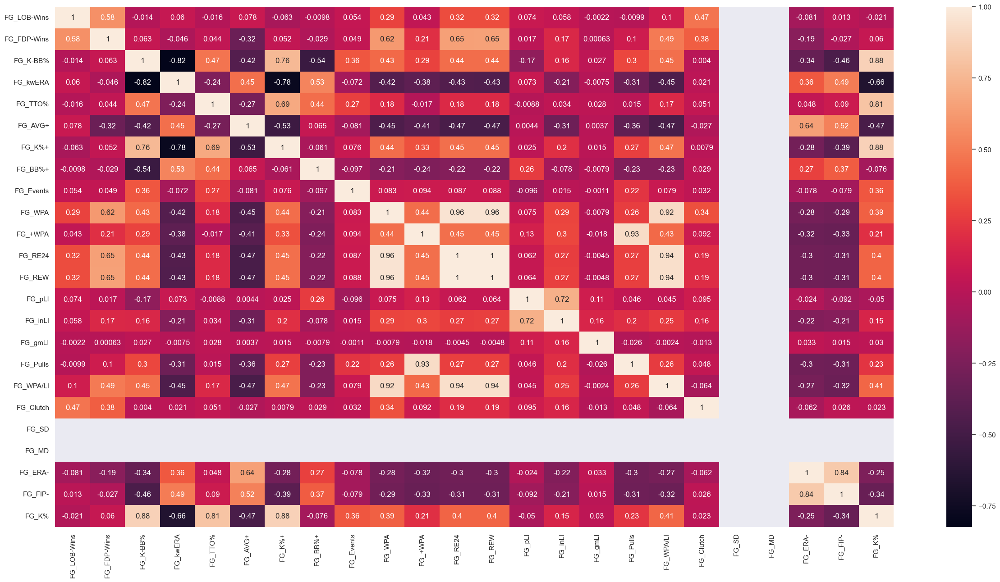

In [96]:
#correlation
X = ss_p_df_train_2_2.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_2.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_2.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

In [97]:
#FG_K% & FG_K-BB%, FG_TTO%, FG_K%+
#FG_WPA/LI & FG_WPA, FG_RE24, FG_REW
#FG_REW & FG_WPA, FG_RE24, FG_WPA/LI
#FG_RE24 & FG_WPA, FG_REW, FG_WPA/LI
#FG_WPA & FG_RE24, FG_REW, FG_WPA/LI

#FG_kwERA & FG_K-BB%


#FG_Pulls & FG_+WPA
#FG_ERA- & FG_FIP-


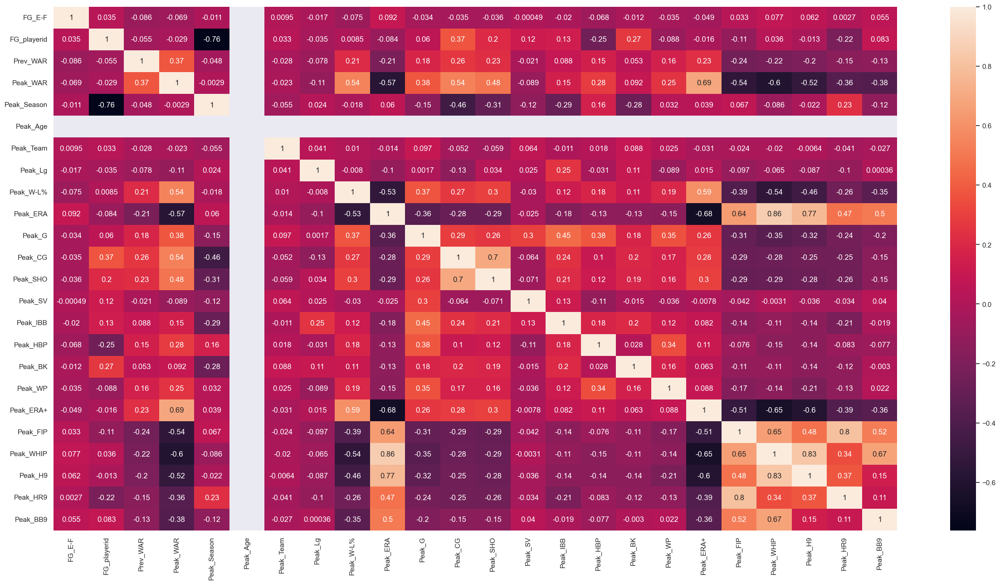

In [98]:
#correlation
X = ss_p_df_train_2_3.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_3.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_3.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

In [99]:
#Peak_WHIP & Peak_ERA, Peak_H9
#Peak_ERA & Peak_WHIP
#Peak_FIP & Peak_HR9
#Peak_WHIP & Peak_H9


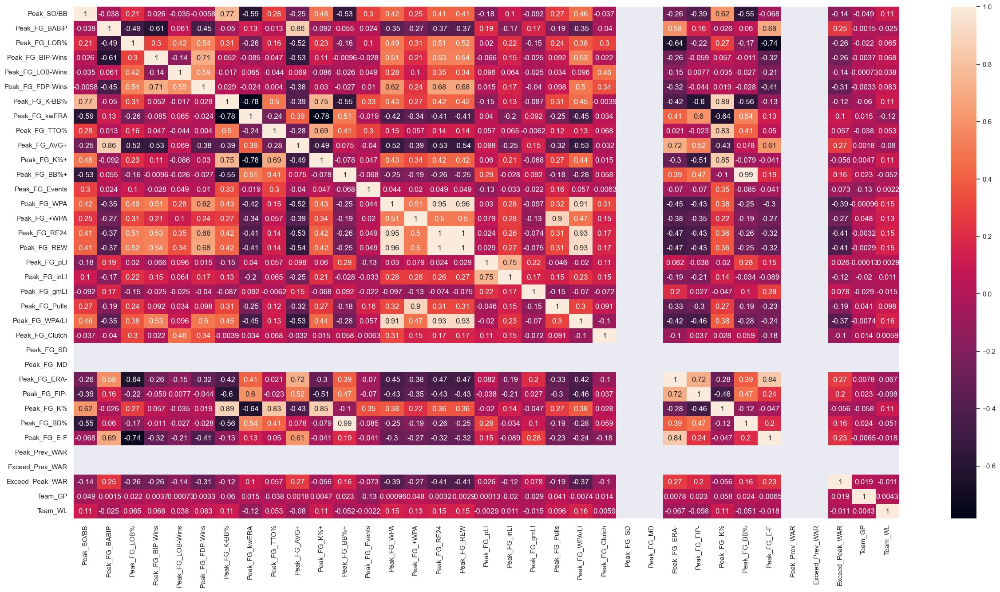

In [100]:
#correlation
X = ss_p_df_train_2_4.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_4.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_4.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

In [101]:
#Peak_FG_BABIP & Peak_FG_AVG+
#Peak_FG_K-BB% & Peak_FG_K%
#Peak_FG_TTO% & Peak_FG_K%
#Peak_FG_K%+ & Peak_FG_K%
#Peak_FG_WPA & Peak_FG_REW, Peak_FG_RE24, Peak_FG_WPA/LI
#Peak_FG_+WPA & Peak_FG_Pulls
#Peak_FG_REW & Peak_FG_RE24
#Peak_FG_WPA/LI & Peak_FG_REW, Peak_FG_RE24
#Peak_FG_ERA- & Peak_FG_E-F
#Peak_FG_K% & Peak_FG_K-BB%, Peak_FG_TTO%, Peak_FG_K%+
#Peak_FG_BB% & Peak_FG_BB%+
#Peak_FG_E-F & Peak_FG_ERA-

In [102]:
#WHIP & ERA
#FG_WHIP & FG_ERA
#HR9 & FIP
#FG_HR9 & FG_FIP
#BB9 & WHIP
#FG_BB9 & FG_WHIP
#H9 & WHIP
#FG_H9 & FG_WHIP
#H9 & ERA
#FG_H9 & FG_ERA
#FG_K% & FG_K-BB%, FG_TTO%, FG_K%+
#FG_WPA/LI & FG_WPA, FG_RE24, FG_REW
#FG_REW & FG_WPA, FG_RE24, FG_WPA/LI
#FG_RE24 & FG_WPA, FG_REW, FG_WPA/LI
#FG_WPA & FG_RE24, FG_REW, FG_WPA/LI
#FG_kwERA & FG_K-BB%
#FG_Pulls & FG_+WPA
#FG_ERA- & FG_FIP-
#Peak_WHIP & Peak_ERA, Peak_H9
#Peak_ERA & Peak_WHIP
#Peak_FIP & Peak_HR9
#Peak_WHIP & Peak_H9
#Peak_FG_BABIP & Peak_FG_AVG+
#Peak_FG_K-BB% & Peak_FG_K%
#Peak_FG_TTO% & Peak_FG_K%
#Peak_FG_K%+ & Peak_FG_K%
#Peak_FG_WPA & Peak_FG_REW, Peak_FG_RE24, Peak_FG_WPA/LI
#Peak_FG_+WPA & Peak_FG_Pulls
#Peak_FG_REW & Peak_FG_RE24
#Peak_FG_WPA/LI & Peak_FG_REW, Peak_FG_RE24
#Peak_FG_ERA- & Peak_FG_E-F
#Peak_FG_K% & Peak_FG_K-BB%, Peak_FG_TTO%, Peak_FG_K%+
#Peak_FG_BB% & Peak_FG_BB%+
#Peak_FG_E-F & Peak_FG_ERA-

In [103]:
ss_p_df_train_2 = ss_p_df_train_2.drop(["FG_RE24","FG_RE24","FG_REW","FG_WPA","FG_WPA/LI",
                                    "Peak_WHIP","WHIP","Peak_FG_E-F","Peak_FG_ERA-","Peak_FG_K-BB%",
                                    "Peak_FG_K%","Peak_FG_K%+","Peak_FG_RE24","Peak_FG_REW","Peak_FG_TTO%",
                                    "Peak_H9","Peak_FG_WPA/LI","Peak_ERA","H9","FG_K-BB%","ERA"], axis=1)



In [104]:
#split dataframes for correlation
ss_p_df_train_2_1 = ss_p_df_train_2.iloc[:, 0:25]
ss_p_df_train_2_2 = ss_p_df_train_2.iloc[:, 26:50]
ss_p_df_train_2_3 = ss_p_df_train_2.iloc[:, 51:]

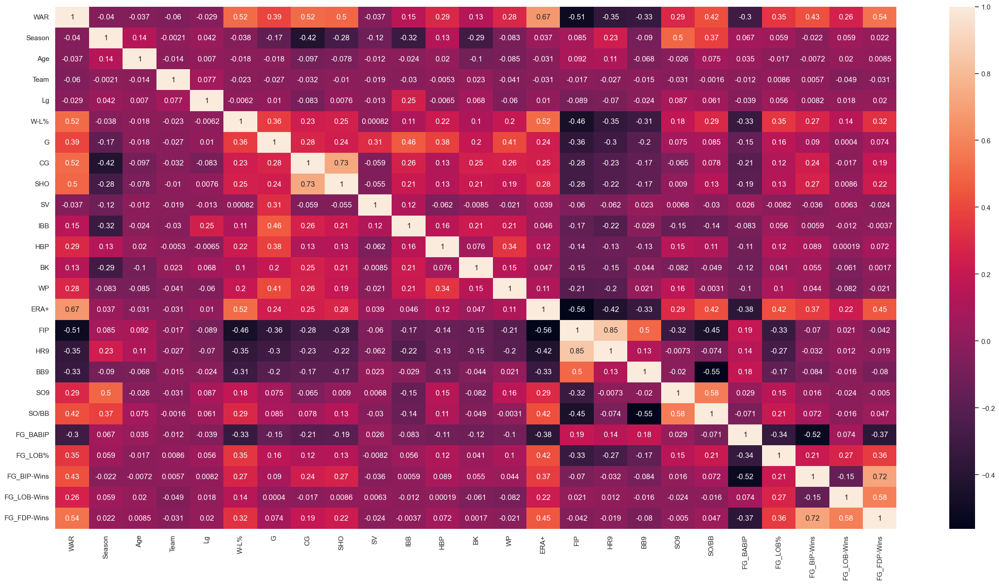

In [105]:
#correlation
X = ss_p_df_train_2_1.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_1.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_1.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

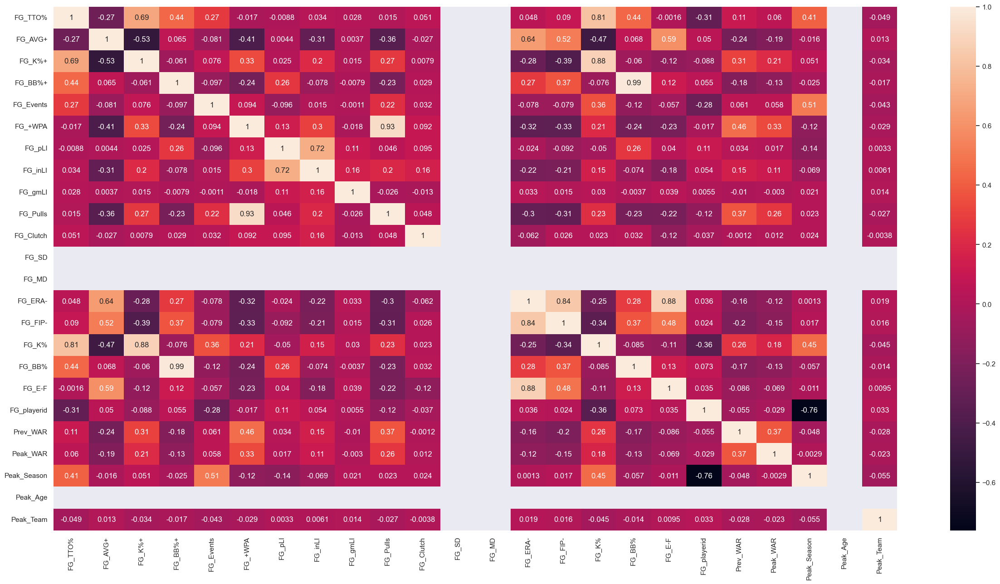

In [106]:
#correlation
X = ss_p_df_train_2_2.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_2.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_2.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

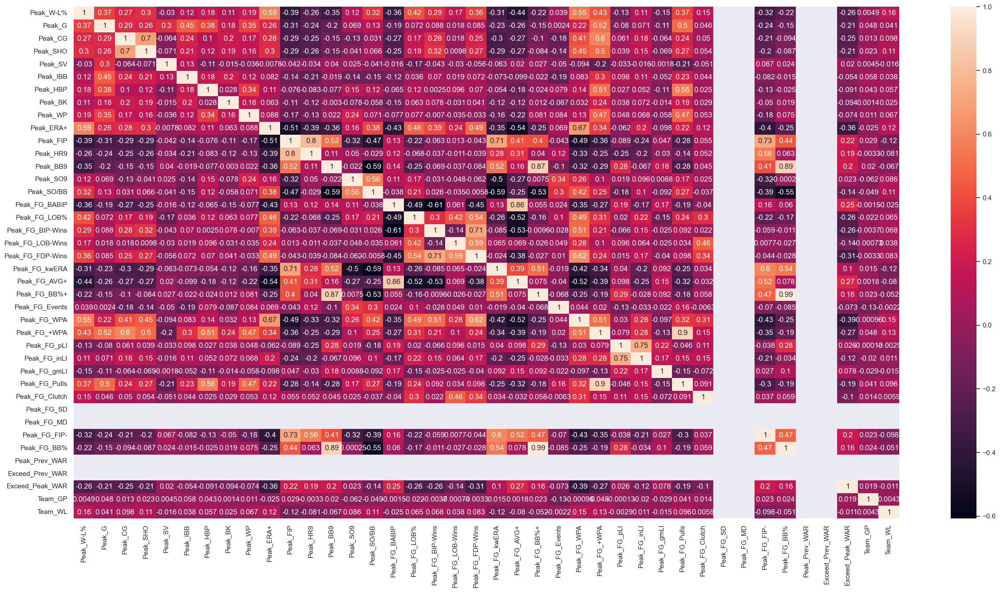

In [107]:
#correlation
X = ss_p_df_train_2_3.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_3.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_3.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

In [108]:
#FIP & HR9
#FG_TTO% & FG_K%
#FG_K%+  & FG_K%
#FG_BB%+ & FG_BB%
#FG_BB% & FG_BB%+

#FG_+WPA & FG_PULLS
#FG_ERA- & FG_FIP-, FG_E-F


#Peak_HR9 & Peak_FIP
#Peak_BB9 & Peak_FG_BB%+, Peak_FG_BB%
#Peak_FG_BABIP & Peak_FG_AVG+
#Peak_FG_+WPA & Peak_FG_Pulls
#Peak_FG_BB% & Peak_BB9, Peak_FG_BB%+


In [109]:
ss_p_df_train_2 = ss_p_df_train_2.drop(["HR9","FG_K%","FG_BB%+","FG_ERA-","FG_+WPA",
                                    "Peak_HR9","Peak_FG_BB%+","Peak_BB9","Peak_FG_AVG+", 
                                    "Peak_FG_+WPA",], axis=1)



In [110]:
#split dataframe for correlation
ss_p_df_train_2_1 = ss_p_df_train_2.iloc[:, 0:25]
ss_p_df_train_2_2 = ss_p_df_train_2.iloc[:, 26:50]
ss_p_df_train_2_3 = ss_p_df_train_2.iloc[:, 51:]

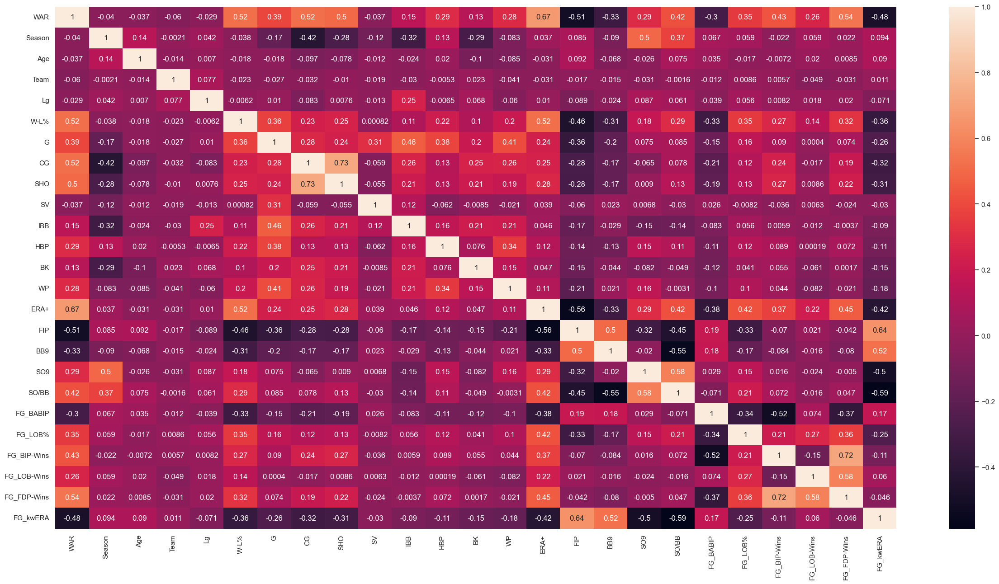

In [111]:
#correlation
X = ss_p_df_train_2_1.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_1.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_1.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

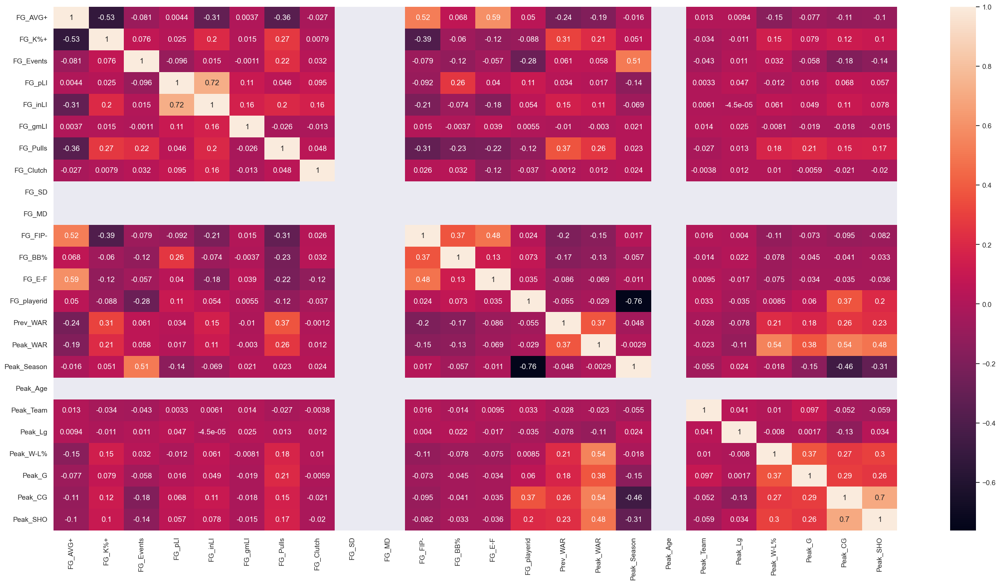

In [112]:
#correlation
X = ss_p_df_train_2_2.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_2.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_2.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

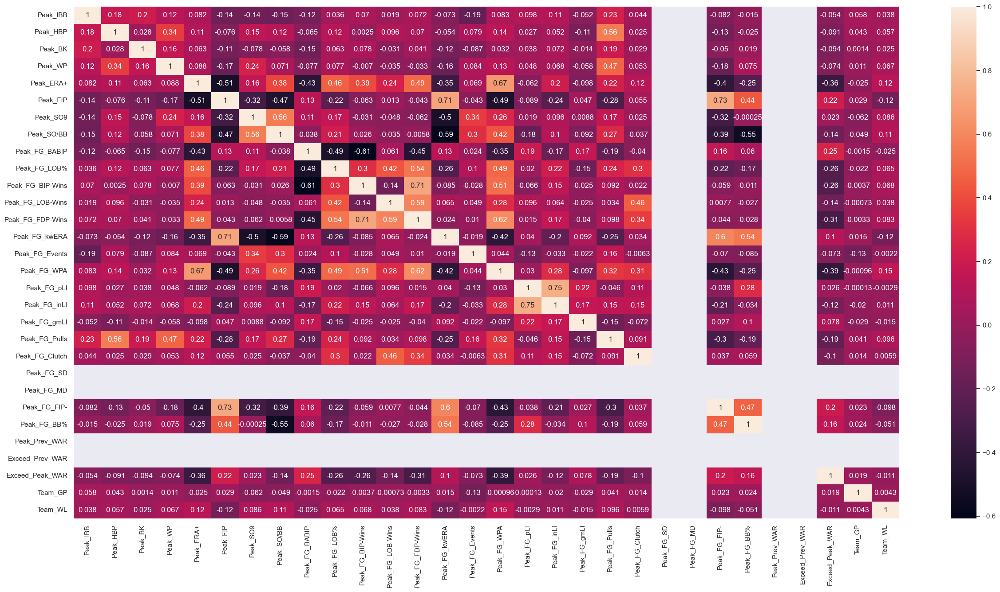

In [113]:
#correlation
X = ss_p_df_train_2_3.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2_3.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2_3.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

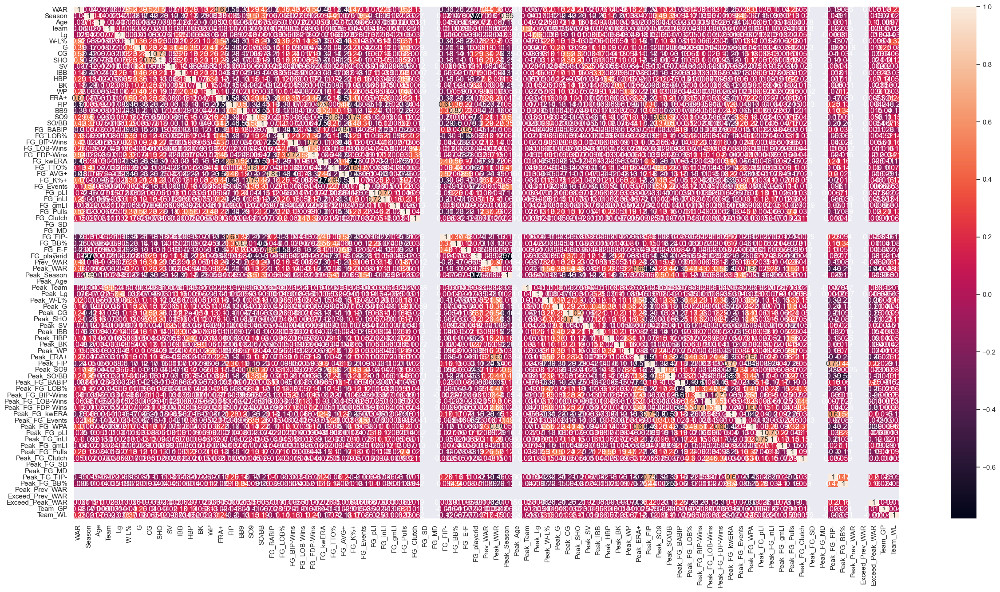

In [114]:
#correlation
X = ss_p_df_train_2.values
N, M = X.shape
#Average of features
Xavg = np.zeros(M) 
for i in range(M):
    Xavg[i] = ss_p_df_train_2.iloc[:,i].mean()

Xcor = np.zeros((M,M))
for x in range(M):
    for y in range(M):
        Xcor[x,y] = np.sum((X[:,x] - Xavg[x]) * (X[:,y] - Xavg[y])) / ((np.sqrt(np.sum((X[:,x] - Xavg[x])**2))) * (np.sqrt(np.sum((X[:,y] - Xavg[y])**2))))

cols = ss_p_df_train_2.columns
sns.heatmap(Xcor, annot=True, xticklabels=cols, yticklabels=cols)
sns.set(rc = {'figure.figsize':(30,15)})
plt.show()

In [115]:
#drop Peak_Season
ss_p_df_train_2 = ss_p_df_train_2.drop(["Peak_Season"], axis=1)



In [116]:
#drop rows where Peak_Prev_WAR are null
ss_p_df_train_2 = ss_p_df_train_2.dropna(subset=['Peak_Prev_WAR'])
ss_p_df_train_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4678 entries, 1 to 6551
Data columns (total 80 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   WAR               4678 non-null   float64
 1   Season            4678 non-null   int64  
 2   Age               4678 non-null   int64  
 3   Team              4678 non-null   int64  
 4   Lg                4678 non-null   int64  
 5   W-L%              4678 non-null   float64
 6   G                 4678 non-null   int64  
 7   CG                4678 non-null   int64  
 8   SHO               4678 non-null   int64  
 9   SV                4678 non-null   int64  
 10  IBB               4678 non-null   int64  
 11  HBP               4678 non-null   int64  
 12  BK                4678 non-null   int64  
 13  WP                4678 non-null   int64  
 14  ERA+              4678 non-null   float64
 15  FIP               4678 non-null   float64
 16  BB9               4678 non-null   float64


In [117]:
#set x and y
ss_p_df_X = ss_p_df_train_2.loc[:, ss_p_df_train_2.columns != 'Exceed_Peak_WAR'].values
ss_p_df_y = ss_p_df_train_2.loc[:, ss_p_df_train_2.columns == 'Exceed_Peak_WAR'].values.ravel()

In [118]:
#scale X cols
ss_p_df_X_svc = StandardScaler().fit_transform(ss_p_df_X)


In [119]:
#set label encoder on y
label_encoder = LabelEncoder()
ss_p_df_y_enc = label_encoder.fit_transform(ss_p_df_y)

In [120]:
#function to split training set for testing porposes
def split_eval_docs(_clf, _Xdocs, _ydocs):
    X_train, X_test, y_train, y_test = train_test_split(_Xdocs, _ydocs, test_size=0.3, random_state=42)
    _clf.fit(X_train, y_train)
    y_pred = _clf.predict(X_test)
    return y_test, y_pred, X_test, X_train

In [121]:
#define RF pipeline
n_cores = 8
rf = Pipeline([('clf', RandomForestClassifier(n_jobs=n_cores, n_estimators=1000,
                                              max_depth=10, random_state=None, class_weight='balanced'))])

In [122]:
%%time

y_test, y_pred, X_test, X_train = split_eval_docs(rf, ss_p_df_X, ss_p_df_y_enc)
print('Random Forest\n' + classification_report(y_test, y_pred, target_names=['0','1']))

Random Forest
              precision    recall  f1-score   support

           0       0.97      0.97      0.97       709
           1       0.97      0.97      0.97       695

    accuracy                           0.97      1404
   macro avg       0.97      0.97      0.97      1404
weighted avg       0.97      0.97      0.97      1404

CPU times: user 6.32 s, sys: 506 ms, total: 6.83 s
Wall time: 1.61 s


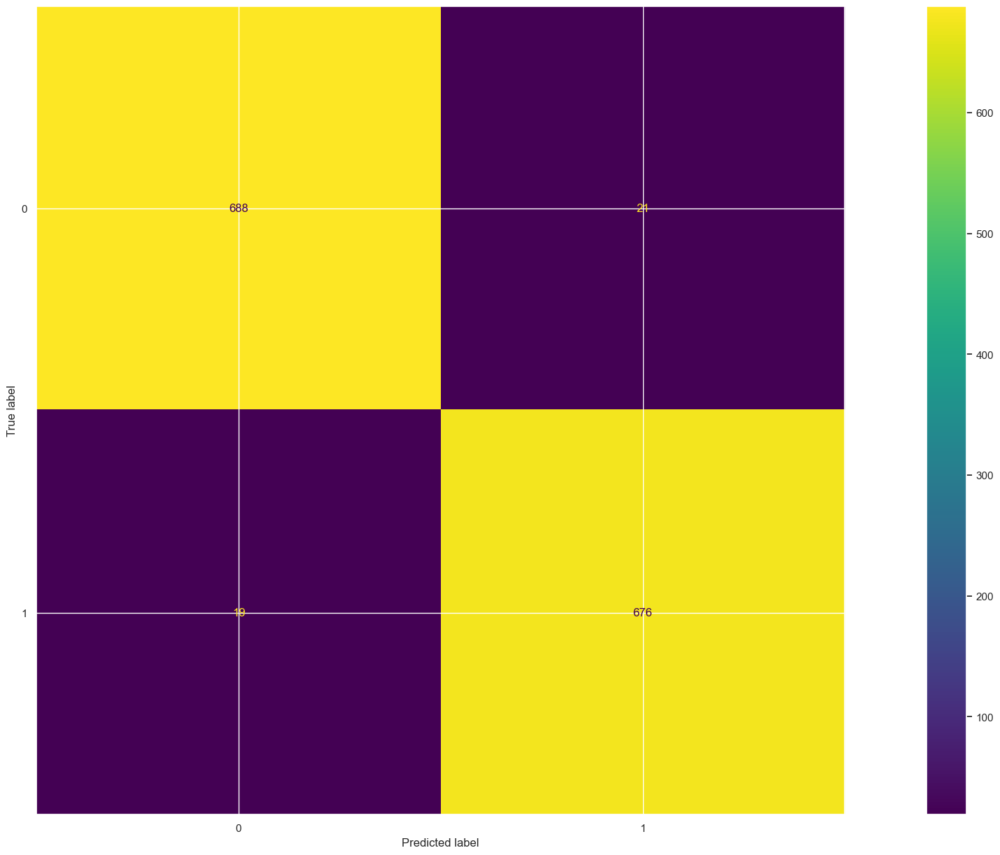

In [123]:
# Create the confusion matrix
cm = confusion_matrix(y_test, y_pred)

ConfusionMatrixDisplay(confusion_matrix=cm).plot();

In [124]:
#drop highly correlated features for 2023 ds
ss_p_df_2023_2 = ss_p_df_2023_2.drop(['Rk','Peak_Rk','FG_-WPA','Peak_FG_-WPA','WAA','Peak_WAA','FG_WAR',
                                    'Peak_FG_WAR', 'FG_RA9-WAR','W', 'L', 'GS', 'Dec', 'IP', 
                                    'H', 'R', 'ER', 'HR', 'BB', 'SO', 'BF','Peak_FG_RA9-WAR', 
                                    'Peak_W', 'Peak_L', 'Peak_GS', 'Peak_Dec', 'Peak_IP', 
                                    'Peak_H', 'Peak_R', 'Peak_ER', 'Peak_HR', 'Peak_BB', 
                                    'Peak_SO', 'Peak_BF','FG_RE24','FG_RE24','FG_REW','FG_WPA','FG_WPA/LI',
                                    'Peak_WHIP','WHIP','Peak_FG_E-F','Peak_FG_ERA-','Peak_FG_K-BB%',
                                    'Peak_FG_K%','Peak_FG_K%+','Peak_FG_RE24','Peak_FG_REW','Peak_FG_TTO%',
                                    'Peak_H9','Peak_FG_WPA/LI','Peak_ERA','H9','FG_K-BB%','ERA','HR9',
                                    'FG_K%','FG_BB%+','FG_ERA-','FG_+WPA',
                                    'Peak_HR9','Peak_FG_BB%+','Peak_BB9','Peak_FG_AVG+', 
                                    'Peak_FG_+WPA','Peak_Season'], axis=1)

In [125]:
#function to check 2023 data
def set_final_docs(_clf, _Xdocs, _ydocs, _Xfinal):
    _clf.fit(_Xdocs, _ydocs)
    y_pred = _clf.predict(_Xfinal)
    return y_pred, _Xfinal

In [126]:
#set x and y
ss_p_df_X_2023 = ss_p_df_2023_2.loc[:, ss_p_df_2023_2.columns != 'Exceed_Peak_WAR'].values
#ss_pos_df_y = ss_pos_df_train_2.loc[:, ss_pos_df_train_2.columns == 'Exceed_Peak_WAR'].values.ravel()

In [127]:
%%time
#run set_final_docs
y_pred, X_final = set_final_docs(rf, ss_p_df_X, ss_p_df_y_enc, ss_p_df_X_2023)


CPU times: user 8.04 s, sys: 409 ms, total: 8.45 s
Wall time: 1.7 s


In [128]:
print('Exceed 2022 WAR in 2023?\t2022 WAR\tPlayer ID\t2023 Age\tPlayer')
for i in range(len(X_final)):
    print(str(y_pred[i]) + '\t\t\t\t' + str(X_final[i][0]) + '\t\t' + str(X_final[i][27]) + '\t\t' + str(X_final[i][2] + 1) + '\t\t' + ss_pos_df_2023_2_player[i])
    

Exceed 2022 WAR in 2023?	2022 WAR	Player ID	2023 Age	Player
1				0.2		70.0		27.0		Brad Keller
1				-0.1		86.0		27.0		Jack Flaherty
1				-0.1		80.0		27.0		Packy Naughton
1				-1.5		85.0		27.0		Josh Fleming
0				2.2		96.0		27.0		Michael Kopech
0				6.4		137.0		27.0		Dylan Cease
0				0.9		123.0		27.0		David Peterson
1				0.0		119.0		27.0		Tylor Megill
0				3.6		104.0		27.0		Kyle Wright
1				-1.0		87.0		27.0		Connor Seabold
0				1.6		85.0		27.0		Tanner Houck
1				0.2		96.0		27.0		Kutter Crawford
0				5.1		119.0		27.0		Zac Gallen
1				-0.1		81.0		27.0		Corbin Martin
0				0.9		65.0		27.0		Devin Smeltzer
1				0.2		97.0		27.0		Chris Paddack
1				0.9		101.0		27.0		Bailey Ober
0				2.2		113.0		27.0		Joe Ryan
1				-0.1		67.0		27.0		Justin Dunn
1				-0.8		35.0		27.0		T.J. Zeuch
1				-0.6		53.0		27.0		Reiver Sanmartin
0				2.0		109.0		27.0		Justin Steele
1				0.0		87.0		27.0		Cory Abbott
1				-0.7		70.0		27.0		Tyson Miller
1				0.5		82.0		27.0		Glenn Otto
1				0.2		155.0		27.0		Nick Nelson
1				0.0

In [129]:
#add exceed
ss_p_df_2023_2['Exceed_Peak_WAR'] = y_pred

In [130]:
#add player name
ss_p_df_2023_2['Player'] = ss_p_df_2023_2_player.values

In [131]:
#check Exceeds
ss_p_df_2023_2[["FG_playerid","Player","Age","Prev_WAR","WAR","Exceed_Prev_WAR","Exceed_Peak_WAR"]][ss_p_df_2023_2["Exceed_Peak_WAR"] == 1]


,FG_playerid,Player,Age,Prev_WAR,WAR,Exceed_Prev_WAR,Exceed_Peak_WAR
3968,15734,Brad Keller,26,-0.3,0.2,1.0,1
4128,17479,Jack Flaherty,26,0.7,-0.1,0.0,1
4130,23292,Packy Naughton,26,-0.2,-0.1,1.0,1
4208,20418,Josh Fleming,26,-0.6,-1.5,0.0,1
4352,21318,Tylor Megill,26,0.6,0.0,0.0,1
4808,19695,Connor Seabold,26,0.0,-1.0,0.0,1
4810,20531,Kutter Crawford,26,-0.3,0.2,1.0,1
4944,19884,Corbin Martin,26,-0.6,-0.1,1.0,1
5062,20099,Chris Paddack,26,-0.6,0.2,1.0,1
5063,21224,Bailey Ober,26,1.2,0.9,0.0,1


In [132]:
#check does not exceeds
ss_p_df_2023_2[["FG_playerid","Player","Age","Prev_WAR","WAR","Exceed_Prev_WAR","Exceed_Peak_WAR"]][ss_p_df_2023_2["Exceed_Peak_WAR"] == 0]


,FG_playerid,Player,Age,Prev_WAR,WAR,Exceed_Prev_WAR,Exceed_Peak_WAR
4224,17282,Michael Kopech,26,1.4,2.2,1.0,0
4225,18525,Dylan Cease,26,2.9,6.4,1.0,0
4351,20302,David Peterson,26,-0.5,0.9,1.0,0
4777,19665,Kyle Wright,26,-0.3,3.6,1.0,0
4809,19879,Tanner Houck,26,1.6,1.6,0.0,0
4943,19291,Zac Gallen,26,2.2,5.1,1.0,0
5061,19487,Devin Smeltzer,26,-0.3,0.9,1.0,0
5064,21390,Joe Ryan,26,0.4,2.2,1.0,0
5254,17312,Justin Steele,26,0.6,2.0,1.0,0
5357,19899,Clarke Schmidt,26,-0.3,0.8,1.0,0


In [133]:
#export out
from pathlib import Path  
filepath = Path('ss_p_df_2023_2_final_pred.csv')  
filepath.parent.mkdir(parents=True, exist_ok=True)  
ss_p_df_2023_2.to_csv(filepath,index=False)  